## Who Am I?

- Dr. Gabe Fierro
    - https://gtf.fyi
- Asst. Professor of Computer Science at Colorado School of Mines
- Research Engineer at the National Renewable Energy Laboratory
- co-founder and lead developer of Brick ontology (https://brickschema.org)
- smart buildings/cities, IoT/CPS, data management, data science

## Session Outline

- outline challenges in dealing with building data
- look at a metadata model of a *real* building:
    - author some queries to find out more about it
    - find out what data is available
- extract real building data using the graph
- conduct some basic analysis

Follow along by clicking "Binder" link at https://github.com/gtfierro/clima-2022

![](./img/bms.png)

![](./img/label-no-pics.png)

![](./img/label-with-pics.png)

## Linking to Data

![Need metadata and data](./img/metadata+data.png)


## Linking to Data

- linked-data metadata models describe structure + composition of buildings
- this metadata provides **context** to better understand building data telemetry
- how do we associate data with the metadata model?
    - it's another "link"!

## Sources of Data and Telemetry

- some common ones:
    - historical telemetry (timeseries data)
    - building geometry, BIM
    - building energy models (BEM)
    - live telemetry (OPC-UA, BACnet, Modbus)


## Sources of Data and Telemetry

- link **to** these other sources:
    - preserve existing investments in models + tools
    - avoid unnecessary duplication
- often other DBs are better at those data anyway...

![ref](./img/refschema.png)

## Looking at an Example Model

In [1]:
import pandas as pd
import rdflib
from rdflib import URIRef, RDF
from IPython import display
import duckdb
import plotly.express as px

conn = duckdb.connect(database='data.duckdb', read_only=True)

%matplotlib inline
def sparql_to_df(g, q):
    res = g.query(q)
    df = pd.DataFrame.from_records(list(res))
    df = df.applymap(str)
    df.drop_duplicates(inplace=True)
    df.columns = [x.lstrip('?') for x in res.vars]
    return df

def get_local_graph(g, node):
    subg = g.cbd(node)
    for o in subg.objects():
        types = g.triples((o, RDF.type, None))
        for t in types:
            subg.add(t)
    return subg

def get_data(uuids, names=None):
    if isinstance(uuids, pd.Series):
        uuids = list(uuids.values)
    sql = "SELECT time, value, id FROM data WHERE list_contains(?::TEXT[], id)"
    df = conn.execute(sql, [uuids]).df()
    df = df.pivot_table(columns='id', values='value', index='time')
    # df = df.resample('15T').mean()
    if names is not None:
        df.columns = names
    return df

from colorbrickgraph import viz

from IPython.display import Javascript
from plotly.offline import get_plotlyjs
Javascript(get_plotlyjs())

<IPython.core.display.Javascript object>

In [2]:
# load in the graph
import brickschema
g = brickschema.Graph()
g.load_file("ttl/Brick.ttl")
g.load_file("ttl/building-compiled.ttl")
print(f"Graph has {len(g)} triples")

Graph has 53476 triples


In [3]:
g.bind("props", rdflib.Namespace("https://w3id.org/props#"))

In [4]:
# what kinds of entities are in the model?
df = sparql_to_df(g, """SELECT ?entity ?type WHERE {
  ?entity a ?type .
  FILTER(REGEX(STR(?entity), "^http://openmetrics.eu/openmetrics#"))
}""")
df.groupby('type').count().sort_values(by='entity', ascending=False).head(10)

,entity
type,
https://w3id.org/bot#Element,326
https://brickschema.org/schema/Brick#TimeseriesReference,323
https://pi.pauwel.be/voc/buildingelement#Wall,204
https://pi.pauwel.be/voc/buildingelement#Door,48
https://brickschema.org/schema/Brick#Space,36
https://w3id.org/bot#Space,36
https://brickschema.org/schema/Brick#Zone,19
https://brickschema.org/schema/Brick#Terminal_Unit,18
https://brickschema.org/schema/Brick#Building_Electrical_Meter,18


In [5]:
# what kinds of data sources are in the model?
df = sparql_to_df(g, """SELECT ?entity ?type WHERE {
  ?entity rdf:type/rdfs:subClassOf* brick:Point .
  ?entity a ?type .
  FILTER(REGEX(STR(?entity), "^http://openmetrics.eu/openmetrics#"))
}""")
df.groupby('type').count().sort_values(by='entity', ascending=False).head(10)

,entity
type,
https://brickschema.org/schema/Brick#Active_Power_Sensor,17
https://brickschema.org/schema/Brick#Delay_Parameter,17
https://brickschema.org/schema/Brick#Max_Temperature_Setpoint_Limit,17
https://brickschema.org/schema/Brick#Min_Temperature_Setpoint_Limit,17
https://brickschema.org/schema/Brick#Mode_Command,17
https://brickschema.org/schema/Brick#Occupancy_Sensor,17
https://brickschema.org/schema/Brick#On_Off_Command,17
https://brickschema.org/schema/Brick#Speed_Setpoint,17
https://brickschema.org/schema/Brick#Zone_Air_Temperature_Sensor,17


Let's zoom into one of the "spaces" and see what is modeled there:
- bold outlined nodes are other "entities" in the model
- color-filled nodes are "classes" or "types"
- edges represent properties and relationships

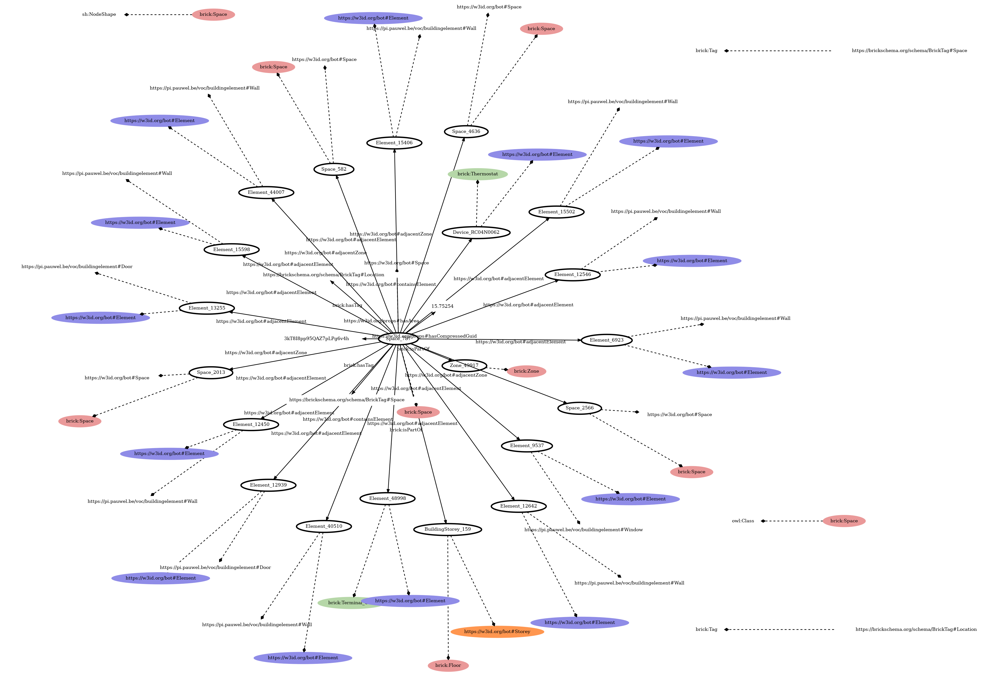

In [6]:
space_graph = get_local_graph(g, URIRef("http://openmetrics.eu/openmetrics#Space_787"))
display.display_png(viz(space_graph))

Alternative textual representation:

In [7]:
# print(space_graph.serialize(format='ttl')[:1900])

![](./img/workflow.png)

Use queries against the *model* to find interesting/relevant data sources, then go fetch the data and analyze!

## Find Sensors in Spaces

Write quick SPARQL query to find sensors which measure locations

In [8]:
df = sparql_to_df(g, """SELECT ?sensor ?data_id ?location WHERE {
   ?sensor rdf:type/rdfs:subClassOf* brick:Sensor .
   ?sensor ref:hasExternalReference/ref:hasTimeseriesId ?data_id .
   ?sensor brick:isPointOf ?location .
   ?location rdf:type/rdfs:subClassOf* brick:Location
}""")
df.head()

,sensor,data_id,location
0,http://openmetrics.eu/openmetrics#RC04N0061_Oc...,TUC.245.77.R4,http://openmetrics.eu/openmetrics#Space_582
1,http://openmetrics.eu/openmetrics#RC04N0062_Oc...,TUC.245.77.R104,http://openmetrics.eu/openmetrics#Space_787
2,http://openmetrics.eu/openmetrics#RC04N0063_Oc...,TUC.245.77.R84,http://openmetrics.eu/openmetrics#Space_1317
3,http://openmetrics.eu/openmetrics#RC04N0064_Oc...,TUC.245.77.R64,http://openmetrics.eu/openmetrics#Space_1147
4,http://openmetrics.eu/openmetrics#RC04N0065_Oc...,TUC.245.77.R44,http://openmetrics.eu/openmetrics#Space_969


Restricting our search to just temperature sensors...

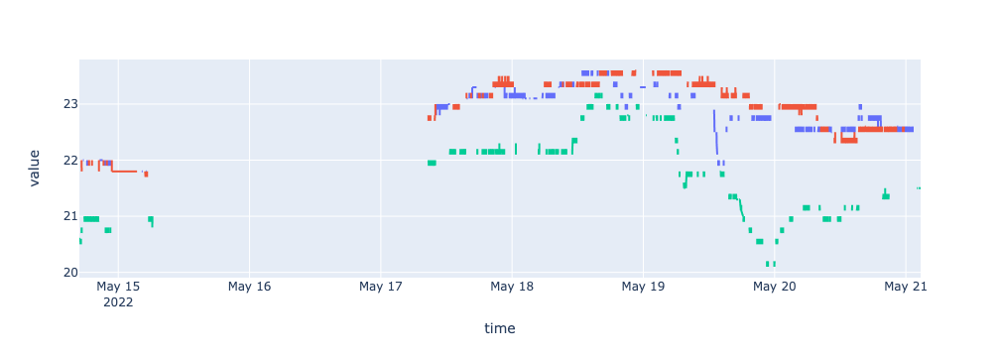

In [9]:
df = sparql_to_df(g, """SELECT ?sensor ?data_id ?location WHERE {
   ?sensor rdf:type/rdfs:subClassOf* brick:Temperature_Sensor .
   ?sensor ref:hasExternalReference/ref:hasTimeseriesId ?data_id .
   ?sensor brick:isPointOf ?location .
   ?location rdf:type/rdfs:subClassOf* brick:Location
}""")
df = get_data(df.data_id[:3], df.location[:3])
fig = px.line(df)
fig.update_layout(showlegend=False)

Get sensors and setpoints for the same space

In [10]:
df = sparql_to_df(g, """SELECT ?sensor_id ?sp_id ?location WHERE {
   ?sensor rdf:type/rdfs:subClassOf* brick:Temperature_Sensor .
   ?sensor ref:hasExternalReference/ref:hasTimeseriesId ?sensor_id .
   ?sensor brick:isPointOf ?location .
   
   ?sp rdf:type/rdfs:subClassOf* brick:Temperature_Setpoint .
   ?sp ref:hasExternalReference/ref:hasTimeseriesId ?sp_id .
   ?sp brick:isPointOf ?location .
   ?location rdf:type/rdfs:subClassOf* brick:Location
}""")
df.head()

,sensor_id,sp_id,location
0,TUC.245.77.R80,TUC.245.77.R88,http://openmetrics.eu/openmetrics#Space_1317
1,TUC.245.77.R440,TUC.245.77.R448,http://openmetrics.eu/openmetrics#Space_1854
2,TUC.245.77.R20,TUC.245.77.R28,http://openmetrics.eu/openmetrics#Space_338
3,TUC.245.77.R380,TUC.245.77.R388,http://openmetrics.eu/openmetrics#Space_3457
4,TUC.245.77.R360,TUC.245.77.R368,http://openmetrics.eu/openmetrics#Space_3641


Plot sensor vs setpoint

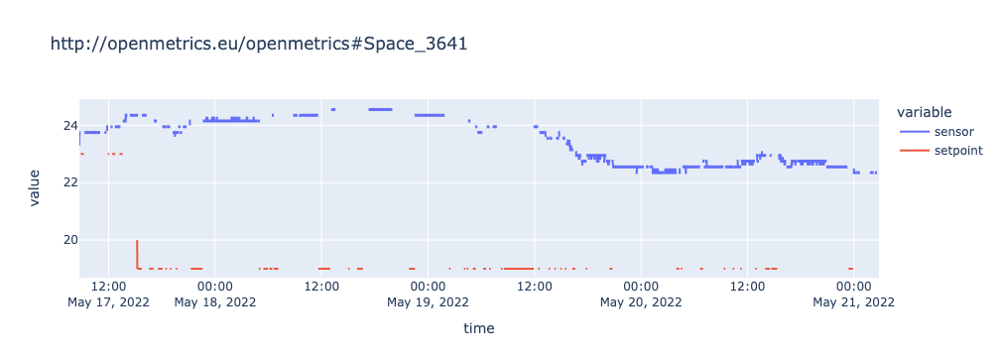

In [11]:
space_name = 'http://openmetrics.eu/openmetrics#Space_3641'
# grab sensor+setpoint name
(sensor, sp, _) = df[df.location == space_name].values[0]
# get the data
d = get_data([sensor, sp], ['sensor', 'setpoint'])['2022-05-17':]
# plot it!
px.line(d, title=space_name)
# ax = d.plot(figsize=(15,5)) ; _ = ax.set_title(space_name)

## Setpoint Deviation Analysis

Produce the distribution of deviation from setpoint for all spaces in the building

In [12]:
def avg_deviation(space_name):
    # get names of data points for the space
    (sensor, sp, _) = df[df.location == space_name].values[0]
    # get the actual data
    d = get_data([sensor, sp], ['sensor', 'setpoint'])
    # do a little cleaning
    d.dropna(inplace=True)
    # compute average absolute deviation
    return (d['setpoint'] - d['sensor']).abs().mean()

In [13]:
# now run for all spaces in our building
all_spaces = df.location.unique()
deviations = pd.DataFrame({'space': all_spaces,
                           'deviation': [avg_deviation(space) for space in all_spaces]})
deviations.sort_values(by='deviation', ascending=False).head(10)

,space,deviation
15,http://openmetrics.eu/openmetrics#Space_3110,5.800000
1,http://openmetrics.eu/openmetrics#Space_1854,5.005882
8,http://openmetrics.eu/openmetrics#Space_969,4.592857
9,http://openmetrics.eu/openmetrics#Space_1147,4.491667
5,http://openmetrics.eu/openmetrics#Space_3819,4.416667
16,http://openmetrics.eu/openmetrics#Space_2934,3.981818
6,http://openmetrics.eu/openmetrics#Space_582,3.655556
10,http://openmetrics.eu/openmetrics#Space_1680,3.600000
4,http://openmetrics.eu/openmetrics#Space_3641,3.341379
7,http://openmetrics.eu/openmetrics#Space_787,3.188889


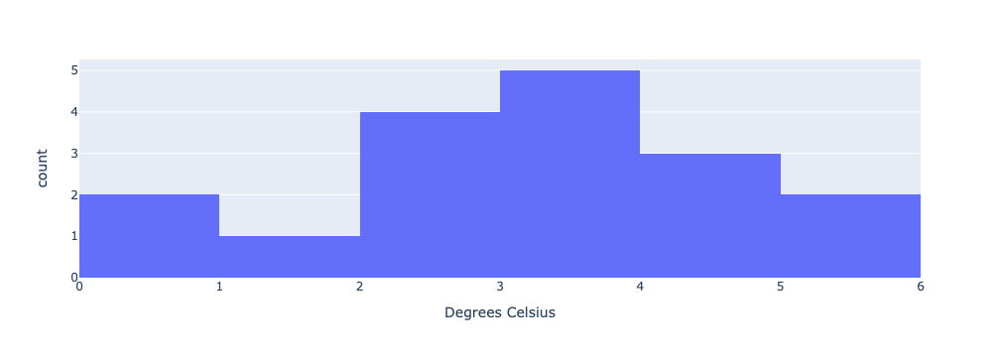

In [14]:
px.histogram(deviations, x='deviation', labels={'deviation': 'Degrees Celsius'})

# Power Usage Intensity

Use BOT + Brick data to look at relationship between room area and how much power the things in the room contain:

In [15]:
# area of spaces
areas = sparql_to_df(g, """SELECT ?location ?area WHERE {
    ?location rdf:type/rdfs:subClassOf* brick:Space .
    ?location props:hasArea ?area
}""")
areas['area'] = areas['area'].astype(float)
areas.head()

,location,area
0,http://openmetrics.eu/openmetrics#Space_4137,2.971325
1,http://openmetrics.eu/openmetrics#Space_4300,2.536987
2,http://openmetrics.eu/openmetrics#Space_4468,3.801856
3,http://openmetrics.eu/openmetrics#Space_4636,4.528568
4,http://openmetrics.eu/openmetrics#Space_4793,2.440534


In [16]:
# energy usage w/n the space
meters = sparql_to_df(g, """SELECT ?location ?point ?pointtype ?id WHERE {
    ?location rdf:type/rdfs:subClassOf* brick:Space .
    ?meter rdf:type/rdfs:subClassOf* brick:Electrical_Meter ;
           brick:hasLocation ?location ;
           brick:hasPoint ?point .
    ?point rdf:type ?pointtype ;
           ref:hasExternalReference/ref:hasTimeseriesId ?id .
}""")
meters.head()

,location,point,pointtype,id
0,http://openmetrics.eu/openmetrics#Space_582,http://openmetrics.eu/openmetrics#RC04N0061_Power,https://brickschema.org/schema/Brick#Active_Po...,TUC.245.77.R2
1,http://openmetrics.eu/openmetrics#Space_787,http://openmetrics.eu/openmetrics#RC04N0062_Power,https://brickschema.org/schema/Brick#Active_Po...,TUC.245.77.R102
2,http://openmetrics.eu/openmetrics#Space_1317,http://openmetrics.eu/openmetrics#RC04N0063_Power,https://brickschema.org/schema/Brick#Active_Po...,TUC.245.77.R82
3,http://openmetrics.eu/openmetrics#Space_1147,http://openmetrics.eu/openmetrics#RC04N0064_Power,https://brickschema.org/schema/Brick#Active_Po...,TUC.245.77.R62
4,http://openmetrics.eu/openmetrics#Space_969,http://openmetrics.eu/openmetrics#RC04N0065_Power,https://brickschema.org/schema/Brick#Active_Po...,TUC.245.77.R42


In [17]:
# get all meter data (hourly max)
meter_data = get_data(meters['id'], meters['location'])\
                .resample('1H')\
                .max()\
                .melt(ignore_index=False)
meter_data.head()

,location,value
time,,
2022-05-14 16:00:00,http://openmetrics.eu/openmetrics#Space_582,0.0
2022-05-14 17:00:00,http://openmetrics.eu/openmetrics#Space_582,0.0
2022-05-14 18:00:00,http://openmetrics.eu/openmetrics#Space_582,0.0
2022-05-14 19:00:00,http://openmetrics.eu/openmetrics#Space_582,0.0
2022-05-14 20:00:00,http://openmetrics.eu/openmetrics#Space_582,0.0


In [18]:
# join data, compute EUI
all_data = areas.merge(meters, on='location', how='inner')
all_data = all_data.merge(meter_data, on='location', how='right')
all_data['eui'] = all_data['area'] * all_data['value']
all_data['time'] = meter_data.index
all_data['location'] = all_data['location'].str.split('#').apply(lambda x: x[-1])

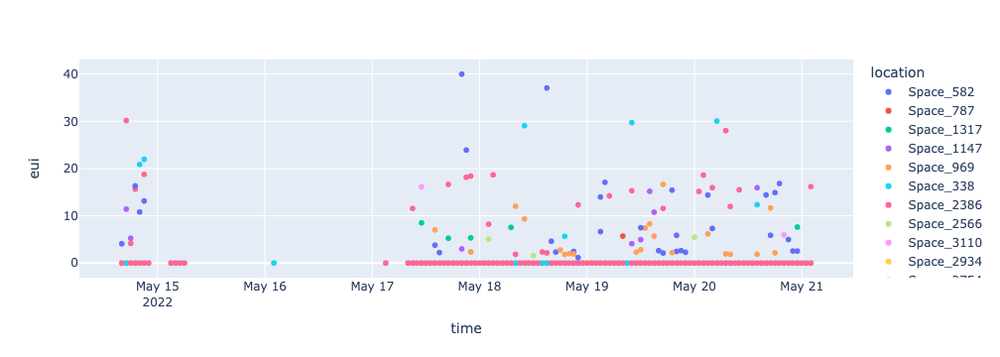

In [19]:
px.scatter(all_data, x='time', y='eui', color='location')

![](./img/analyses.png)

### Conclusion

- all this code and data is online!
    - https://github.com/gtfierro/clima-2022
- learn more at:
    - https://www.w3.org/community/lbd/
    - https://brickschema.org
- documentation, code, data, example:
    - https://docs.brickschema.org